#### Modules

In [10]:
import os
import json
from pathlib import Path
import torch
import torch.nn as nn
import torch.nn.functional as F
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# Preventing potential issues with multiple OpenMP libraries (common with PyTorch and some other libraries)
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'

#### Original CNN Architecture (putting the parameters back in)

In [2]:
# Keep architecture identical to the training notebook so state_dict loading matches.
class CNNBinary(nn.Module):
    def __init__(self):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(64, 128, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(2),)
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 30 * 30, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(64, 1),)
    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

#### Utilize GPU

In [3]:
# Use GPU when available.
if torch.cuda.is_available():
    device = torch.device("cuda")
elif hasattr(torch.backends, "mps") and torch.backends.mps.is_available() and torch.backends.mps.is_built():
    device = torch.device("mps")
else:
    device = torch.device("cpu")

#### Reload models and metadata from phase 2

In [4]:
# Define paths to the model files and metadata
root = Path(".")
walls_model_path = root / "model_walls.pth"
decks_model_path = root / "model_decks.pth"
metadata_path = root / "model_metadata.json"

# Use GPU for CNN
model_walls = CNNBinary().to(device)
model_decks = CNNBinary().to(device)

# Load the parameters of the trained model (state_dict) into the model architecture
model_walls.load_state_dict(torch.load(walls_model_path, map_location=device))
model_decks.load_state_dict(torch.load(decks_model_path, map_location=device))

# Load the thresholds from the metadata file
model_walls.eval()
model_decks.eval()
with metadata_path.open("r", encoding="utf-8") as f:
    metadata = json.load(f)
best_threshold_walls = metadata.get("best_threshold_walls", 0.5)
best_threshold_decks = metadata.get("best_threshold_decks", 0.5)

# Check whether the models and metadata are loaded correctly
print("Models and metadata loaded successfully.")
print(f"Device: {device}")
print(f"Walls threshold: {best_threshold_walls}")
print(f"Decks threshold: {best_threshold_decks}")

Models and metadata loaded successfully.
Device: cuda
Walls threshold: 0.45999999999999985
Decks threshold: 0.48999999999999977


#### 10 sample wall images from the original Wall dataset

In [ ]:
# Load  the original wall datasets
df_walls = pd.read_pickle('wall_data.pkl')

# Select 5 cracked and 5 non-cracked wall images for visualization
cracked_walls = df_walls[df_walls['Label'] == 'Cracked'].sample(5, random_state=42)
non_cracked_walls = df_walls[df_walls['Label'] == 'Non-Cracked'].sample(5, random_state=42)

# Combine them
sample_wall_images = pd.concat([cracked_walls, non_cracked_walls]).reset_index(drop=True)
print(f"Selected {len(sample_wall_images)} sample wall images for filter visualization")
print(f"Distribution: {sample_wall_images['Label'].value_counts().to_dict()}")

Selected 10 sample wall images for filter visualization
Distribution: {'Cracked': 5, 'Non-Cracked': 5}


#### 10 sample deck images from the original deck dataset

In [ ]:
# Load the original deck datasets
df_decks = pd.read_pickle('deck_data.pkl')

# Select 5 cracked and 5 non-cracked deck images for visualization
cracked_decks = df_decks[df_decks['Label'] == 'Cracked'].sample(5, random_state=42)
non_cracked_decks = df_decks[df_decks['Label'] == 'Non-Cracked'].sample(5, random_state=42)

# Combine them
sample_deck_images = pd.concat([cracked_decks, non_cracked_decks]).reset_index(drop=True)
print(f"Selected {len(sample_deck_images)} sample deck images for filter visualization")
print(f"Distribution: {sample_deck_images['Label'].value_counts().to_dict()}")

Selected 10 sample deck images for filter visualization
Distribution: {'Cracked': 5, 'Non-Cracked': 5}


#### Determine the predicted results for sample images

In [12]:
# Function to get the CNN model's prediction for an image (Cracked or Non-Cracked)
def get_model_prediction(image, model, threshold):
    
    # Convert image to tensor and normalize
    img_tensor = torch.from_numpy(image.astype(np.float32) / 255.0)
    
    # Ensure it's 3 channels (RGB)
    if img_tensor.ndim == 2:
        img_tensor = img_tensor.unsqueeze(0).repeat(3, 1, 1)
    elif img_tensor.shape[2] == 3:
        img_tensor = img_tensor.permute(2, 0, 1)
    img_tensor = img_tensor.unsqueeze(0).to(device)
    
    # retrieve predicted probability and class label
    with torch.no_grad():
        logit = model(img_tensor).squeeze()
        probability = torch.sigmoid(logit).item()
        prediction = 'Cracked' if probability >= threshold else 'Non-Cracked'
    return prediction, probability

#### Extract Learned Filters from First Convolutional Layer

In [ ]:
# Function to apply convolutional filters defined in the CNN model to an image and return the feature maps.
def apply_conv_layer(image, model, layer_idx=0):
    
    # Convert image to tensor and normalize
    img_tensor = torch.from_numpy(image.astype(np.float32) / 255.0)
    
    # Ensure it's 3 channels
    if img_tensor.ndim == 2:
        img_tensor = img_tensor.unsqueeze(0).repeat(3, 1, 1)
    elif img_tensor.shape[2] == 3:
        img_tensor = img_tensor.permute(2, 0, 1) 
    img_tensor = img_tensor.unsqueeze(0).to(device) 
    
    # Apply first conv layer and ReLU
    with torch.no_grad():
        conv_output = model.features[0](img_tensor) 
        activated_output = model.features[1](conv_output)  
    return activated_output.squeeze(0).cpu().numpy()

#### Visualize original images and selected filter responses for 10 sample images

In [21]:
# Function to visualize filter responses and prediction results for each sample image
def visualize_filters(num_filters, filter_indices,sample_images, model, best_threshold):
    for img_idx in range(len(sample_images)):
        row = sample_images.iloc[img_idx]
        image = row['ImageData']
        actual_label = row['Label']
        
        # Get model prediction
        predicted_label, confidence = get_model_prediction(image, model, best_threshold)
        
        # Apply filters
        filtered_images = apply_conv_layer(image, model)
        
        # Create visualization
        fig = plt.figure(figsize=(18, 3))
        gs = GridSpec(1, num_filters + 1, figure=fig)
        
        # Original image
        ax0 = fig.add_subplot(gs[0, 0])
        ax0.imshow(image)
        ax0.set_title(f'Actual: {actual_label} \nPredicted: {predicted_label} \nConfidence: {confidence:.3f}', fontsize=9, fontweight='bold')
        ax0.axis('off')
        
        # Filtered images
        for i, filter_idx in enumerate(filter_indices):
            ax = fig.add_subplot(gs[0, i + 1])
            feature_map = filtered_images[filter_idx]
            ax.imshow(feature_map, cmap='viridis')
            ax.set_title(f'Filter {filter_idx+1}\nResponse', fontsize=10, fontweight='bold')
            ax.axis('off')
        
        # Set overall title and layout
        plt.suptitle(f'Image {img_idx+1} - Original vs Filter Responses', fontsize=12, fontweight='bold', y=1.02)
        plt.tight_layout()
        plt.show()
        plt.close(fig)
        
        # Clear GPU cache every few iterations to prevent memory buildup
        if device.type == 'cuda' and (img_idx + 1) % 3 == 0:
            torch.cuda.empty_cache()

#### Validation for wall model

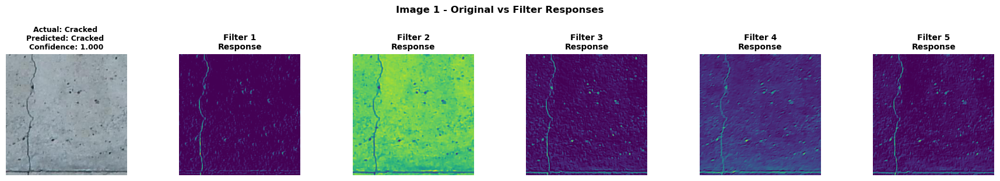

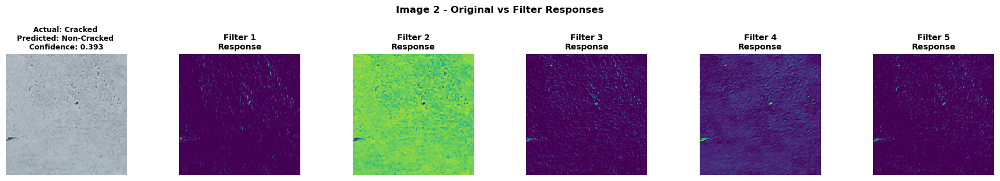

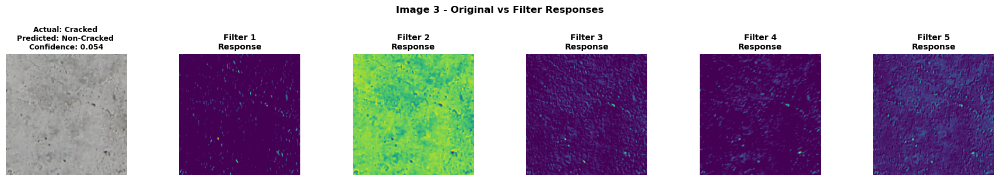

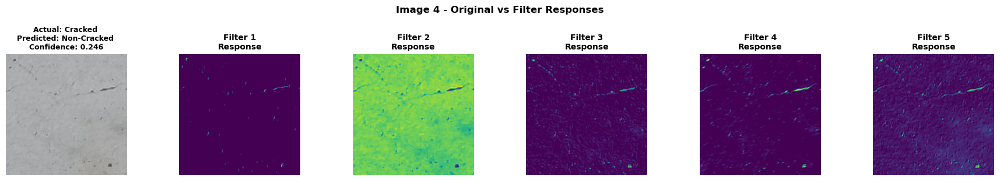

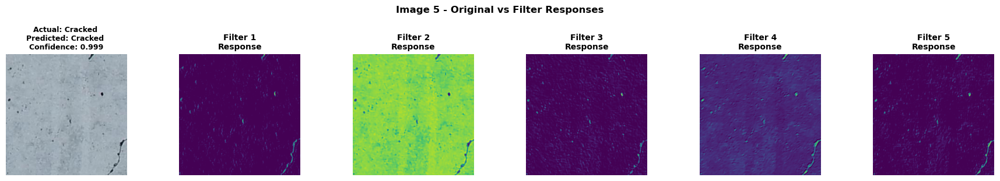

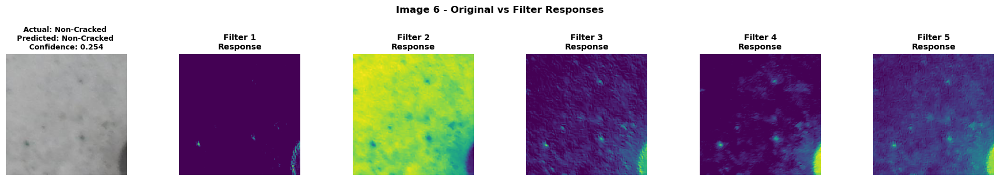

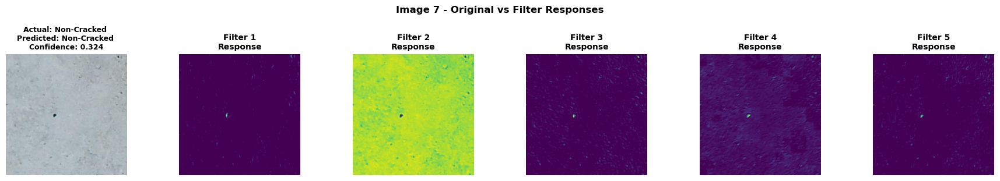

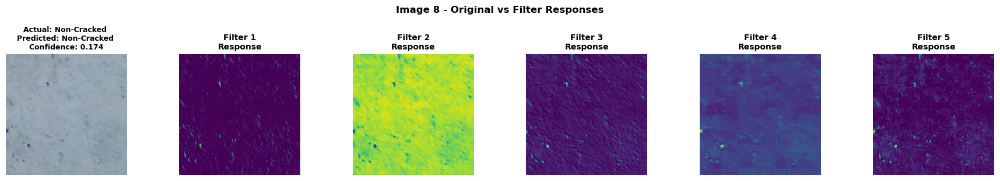

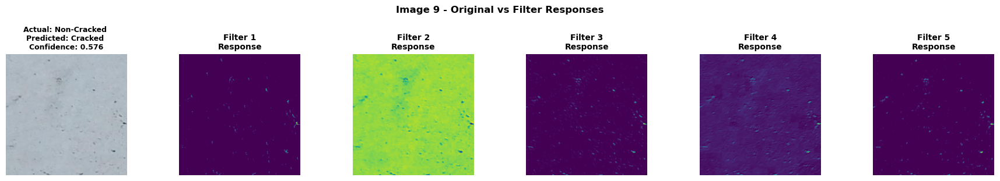

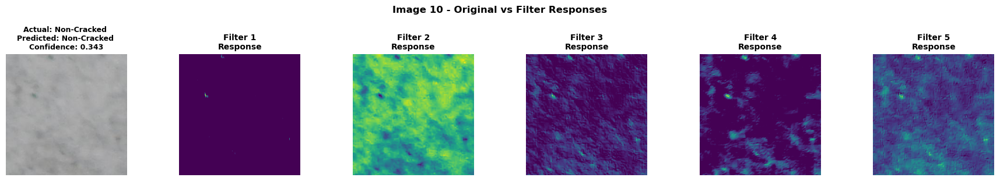

In [22]:
visualize_filters(num_filters = 5, filter_indices = [0, 1, 2, 3, 4], sample_images = sample_wall_images, 
                  model = model_walls, best_threshold = best_threshold_walls)

#### Validation for deck model

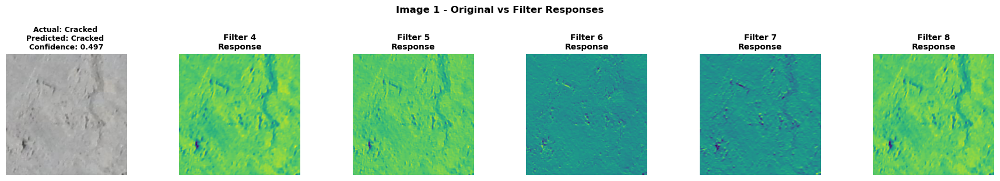

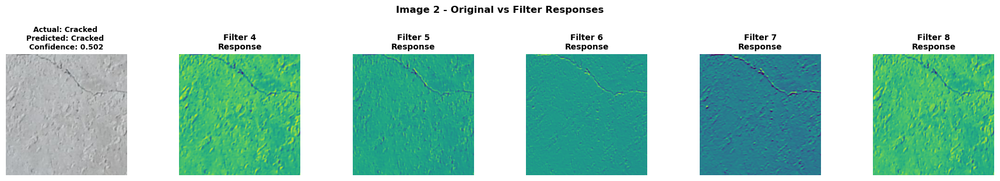

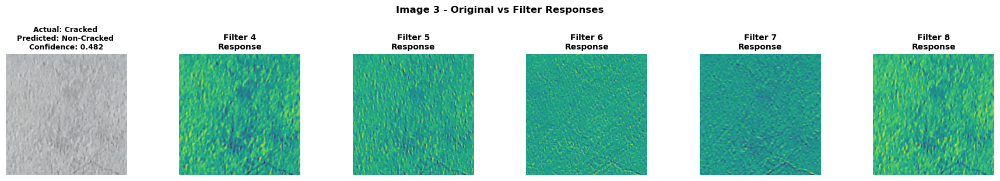

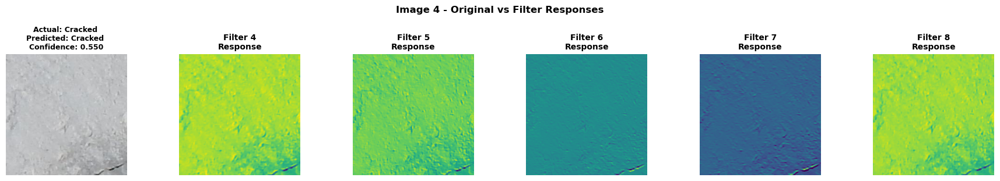

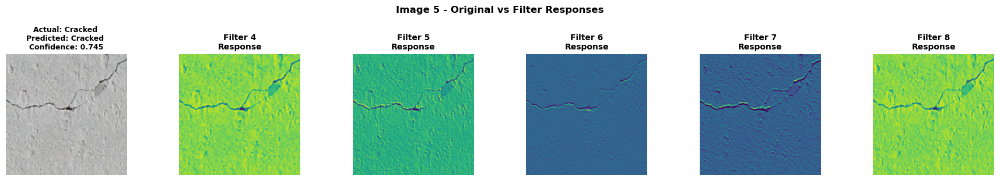

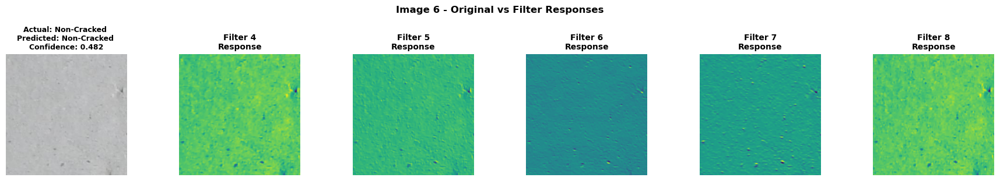

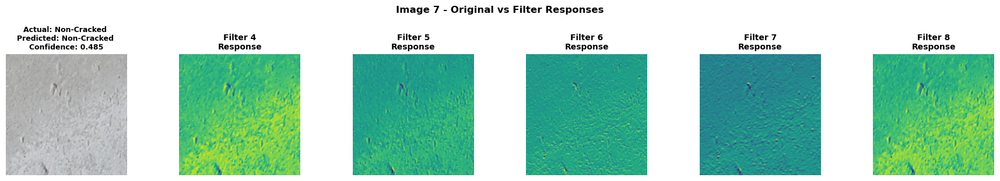

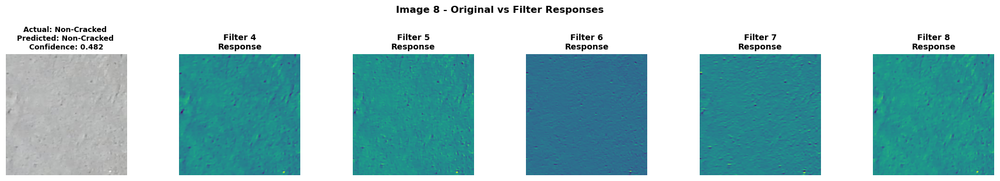

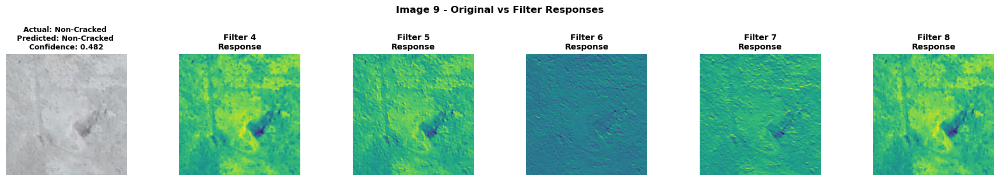

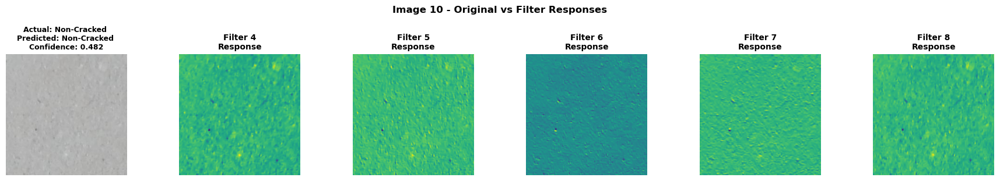

In [24]:
visualize_filters(num_filters = 5, filter_indices = [3, 4, 5, 6, 7], sample_images = sample_deck_images, 
                  model = model_decks, best_threshold = best_threshold_decks)

#### Conclusion: 

1. The poor performance of the models was largely due to the noisely labels

2. Based on the observation of the filters, the model walls is much more effective than model decks